# Movie Genre Classification Based on Music Sountrack

In [3]:
from __future__ import print_function

In [4]:
# We'll need numpy for some mathematical operations
import numpy as np


# matplotlib for displaying the output
import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
%matplotlib inline


# and IPython.display for audio output
import IPython.display


# Librosa for audio
import librosa
# And the display module for visualization
import librosa.display
import glob
import os

import tensorflow as tf
from matplotlib.pyplot import specgram
from sklearn import preprocessing
from keras.utils.np_utils import to_categorical

## Mel spectrogram 

In [5]:
def show_mel_spectogram(audio_path):
    y, sr = librosa.load(audio_path)
    # Let's make and display a mel-scaled power (energy-squared) spectrogram
    S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)

    # Convert to log scale (dB). We'll use the peak power as reference.
    log_S = librosa.logamplitude(S, ref_power=np.max)

    # Make a new figure
    plt.figure(figsize=(12,4))

    # Display the spectrogram on a mel scale
    # sample rate and hop length parameters are used to render the time axis
    librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')

    # Put a descriptive title on the plot
    plt.title('mel power spectrogram')

    # draw a color bar
    plt.colorbar(format='%+02.0f dB')

    # Make the figure layout compact
    plt.tight_layout()
    plt.show()

## Harmonic-percussive source separation

In [6]:
def show_harmonic_percussive_separation(audio_path):
    y, sr = librosa.load(audio_path)
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    # What do the spectrograms look like?
    # Let's make and display a mel-scaled power (energy-squared) spectrogram
    S_harmonic   = librosa.feature.melspectrogram(y_harmonic, sr=sr)
    S_percussive = librosa.feature.melspectrogram(y_percussive, sr=sr)

    # Convert to log scale (dB). We'll use the peak power as reference.
    log_Sh = librosa.logamplitude(S_harmonic, ref_power=np.max)
    log_Sp = librosa.logamplitude(S_percussive, ref_power=np.max)

    # Make a new figure
    plt.figure(figsize=(12,6))

    plt.subplot(2,1,1)
    # Display the spectrogram on a mel scale
    librosa.display.specshow(log_Sh, sr=sr, y_axis='mel')

    # Put a descriptive title on the plot
    plt.title('mel power spectrogram (Harmonic)')

    # draw a color bar
    plt.colorbar(format='%+02.0f dB')

    plt.subplot(2,1,2)
    librosa.display.specshow(log_Sp, sr=sr, x_axis='time', y_axis='mel')

    # Put a descriptive title on the plot
    plt.title('mel power spectrogram (Percussive)')

    # draw a color bar
    plt.colorbar(format='%+02.0f dB')

    # Make the figure layout compact
    plt.tight_layout()
    plt.show()

## Chromagram

Chroma features to represent pitch class information.

In [7]:
def show_pitch_chromagram(audio_path):    
    y, sr = librosa.load(audio_path)
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    # We'll use a CQT-based chromagram here.  An STFT-based implementation also exists in chroma_cqt()
    # We'll use the harmonic component to avoid pollution from transients
    C = librosa.feature.chroma_cqt(y=y_harmonic, sr=sr)

    # Make a new figure
    plt.figure(figsize=(12,4))

    # Display the chromagram: the energy in each chromatic pitch class as a function of time
    # To make sure that the colors span the full range of chroma values, set vmin and vmax
    librosa.display.specshow(C, sr=sr, x_axis='time', y_axis='chroma', vmin=0, vmax=1)

    plt.title('Chromagram')
    plt.colorbar()

    plt.tight_layout()
    plt.show()

## MFCC

Mel-frequency cepstral coefficients are commonly used to represent texture or timbre of sound.

In [8]:
def show_mfcc_textures(audio_path):    
    y, sr = librosa.load(audio_path)
    # Let's make and display a mel-scaled power (energy-squared) spectrogram
    S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)
    # Convert to log scale (dB). We'll use the peak power as reference.
    log_S = librosa.logamplitude(S, ref_power=np.max)
    # Next, we'll extract the top 13 Mel-frequency cepstral coefficients (MFCCs)
    mfcc        = librosa.feature.mfcc(S=log_S, n_mfcc=13)

    # Let's pad on the first and second deltas while we're at it
    delta_mfcc  = librosa.feature.delta(mfcc)
    delta2_mfcc = librosa.feature.delta(mfcc, order=2)

    # How do they look?  We'll show each in its own subplot
    plt.figure(figsize=(12, 6))

    plt.subplot(3,1,1)
    librosa.display.specshow(mfcc)
    plt.ylabel('MFCC')
    plt.colorbar()

    plt.subplot(3,1,2)
    librosa.display.specshow(delta_mfcc)
    plt.ylabel('MFCC-$\Delta$')
    plt.colorbar()

    plt.subplot(3,1,3)
    librosa.display.specshow(delta2_mfcc, sr=sr, x_axis='time')
    plt.ylabel('MFCC-$\Delta^2$')
    plt.colorbar()

    plt.tight_layout()
    plt.show()

# Beat tracking

The beat tracker returns an estimate of the tempo (in beats per minute) and frame indices of beat events.

In [9]:
def show_beat_tracking(audio_path):
    y, sr = librosa.load(audio_path)
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    # Now, let's run the beat tracker.
    # We'll use the percussive component for this part
    plt.figure(figsize=(12, 6))
    tempo, beats = librosa.beat.beat_track(y=y_percussive, sr=sr)
    # Let's make and display a mel-scaled power (energy-squared) spectrogram
    S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)
    # Convert to log scale (dB). We'll use the peak power as reference.
    log_S = librosa.logamplitude(S, ref_power=np.max)

    # Let's re-draw the spectrogram, but this time, overlay the detected beats
    plt.figure(figsize=(12,4))
    librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')

    # Let's draw transparent lines over the beat frames
    plt.vlines(librosa.frames_to_time(beats),
               1, 0.5 * sr,
               colors='w', linestyles='-', linewidth=2, alpha=0.5)

    plt.axis('tight')

    plt.colorbar(format='%+02.0f dB')

    plt.tight_layout()
    plt.show()
    print('Estimated tempo:        %.2f BPM' % tempo)
    print('First 5 beat frames:   ', beats[:5])
    # Frame numbers are great and all, but when do those beats occur?
    print('First 5 beat times:    ', librosa.frames_to_time(beats[:5], sr=sr))

## Beat-synchronous feature aggregation

Summarizes the feature content of each beat.

In [10]:
def show_beat_synchronous_feature_aggregation(audio_path):
    # feature.sync will summarize each beat event by the mean feature vector within that beat
    y, sr = librosa.load(audio_path)
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    # Now, let's run the beat tracker.
    # We'll use the percussive component for this part
    plt.figure(figsize=(12, 6))
    tempo, beats = librosa.beat.beat_track(y=y_percussive, sr=sr)
    S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)
    # Convert to log scale (dB). We'll use the peak power as reference.
    log_S = librosa.logamplitude(S, ref_power=np.max)
    # Next, we'll extract the top 13 Mel-frequency cepstral coefficients (MFCCs)
    mfcc        = librosa.feature.mfcc(S=log_S, n_mfcc=13)
    # Let's pad on the first and second deltas while we're at it
    delta_mfcc  = librosa.feature.delta(mfcc)
    delta2_mfcc = librosa.feature.delta(mfcc, order=2)
    M = np.vstack([mfcc, delta_mfcc, delta2_mfcc])
    M_sync = librosa.util.sync(M, beats)

    plt.figure(figsize=(12,6))

    # Let's plot the original and beat-synchronous features against each other
    plt.subplot(2,1,1)
    librosa.display.specshow(M)
    plt.title('MFCC-$\Delta$-$\Delta^2$')

    # We can also use pyplot *ticks directly
    # Let's mark off the raw MFCC and the delta features
    plt.yticks(np.arange(0, M.shape[0], 13), ['MFCC', '$\Delta$', '$\Delta^2$'])

    plt.colorbar()

    plt.subplot(2,1,2)
    # librosa can generate axis ticks from arbitrary timestamps and beat events also
    librosa.display.specshow(M_sync, x_axis='time',
                             x_coords=librosa.frames_to_time(librosa.util.fix_frames(beats)))

    plt.yticks(np.arange(0, M_sync.shape[0], 13), ['MFCC', '$\Delta$', '$\Delta^2$'])             
    plt.title('Beat-synchronous MFCC-$\Delta$-$\Delta^2$')
    plt.colorbar()

    plt.tight_layout()
    plt.show()

## Extracting sound features

In [11]:
def extract_features(audio_path):
    y, sample_rate = librosa.load(audio_path)
    S = librosa.feature.melspectrogram(y, sr=sample_rate, n_mels=128)
    log_S = librosa.logamplitude(S, ref_power=np.max)
    y_harmonic, y_percussive = librosa.effects.hpss(y)
    tempo_bpm, beats = librosa.beat.beat_track(y=y_percussive, sr=sample_rate)
    stft = np.abs(librosa.stft(y))
    mfcc        = librosa.feature.mfcc(y=y, sr=sample_rate, n_mfcc=40)
    mfccs = np.mean(mfcc.T,axis=0)
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
    mel = np.mean(librosa.feature.melspectrogram(y, sr=sample_rate).T,axis=0)
    contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
    tonnetz = np.mean(librosa.feature.tonnetz(y=y_harmonic,sr=sample_rate).T,axis=0)
    #print(len(mfccs))
    #print(len(chroma_stft))
    #print(len(mel))
    #print(len(contrast))
    #print(len(tonnetz))
    return mfccs, chroma_stft, mel,contrast,tonnetz, tempo_bpm

### Loading audio from directory

In [12]:
def windows(data, window_size):
    start = 0
    while start < len(data):
        yield start, start + window_size
        start += (window_size / 2)

    
def parse_audio_files_for_cnn(parent_dir,sub_dirs, bands, frames, file_ext="*.wav"):
    window_size = 512 * (frames - 1)
    log_specgrams = []    
    #mfccs = []
    
    labels = []
    number = 0
    for label, sub_dir in enumerate(sub_dirs):
        for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
            #print("fn {}".format(fn))
            sound_clip, sample_rate = librosa.load(fn)
            label = fn.split('/')[2].split('.')[0] #<path>/<label>.<title>.wav
            title = fn.split('/')[2].split('.')[1] #<path>/<label>.<title>.wav
            number += 1 
            print("label {} title {} number {}".format(label, title, number))
            try:
                for (start,end) in windows(sound_clip,window_size):
                        if(len(sound_clip[start:end]) == window_size):
                            signal = sound_clip[start:end]                           
                            #extract features from window                            
                            melspec = librosa.feature.melspectrogram(signal, n_mels = bands)                        
                            logspec = librosa.logamplitude(melspec)                           
                            #mfcc = librosa.feature.mfcc(signal, n_mfcc=bands) 
                            #append to array (first add new axis)
                            logspec = logspec.T.flatten()[:, np.newaxis].T
                            #mfcc = mfcc.T.flatten()[:, np.newaxis].T
                            log_specgrams.append(logspec)                        
                            #mfccs.append(mfcc)                        
                            labels.append(label)
            except Exception as e:
                print("Error {} encountered while parsing file: {}".format(e,fn))
                continue
    
    #reshape to tensor
    log_specgrams = np.asarray(log_specgrams).reshape(len(log_specgrams),bands,frames,1)
    #mfccs =  np.asarray(mfccs).reshape(len(mfccs),bands,frames,1)                                                    
   
    #adding channels of features
    features = np.concatenate((log_specgrams, np.zeros(np.shape(log_specgrams)),np.zeros(np.shape(log_specgrams))), axis = 3)
    #features = np.concatenate((mfccs, np.zeros(np.shape(mfccs)),np.zeros(np.shape(mfccs))), axis = 3)
    #adding delta of features
    for i in range(len(features)):
        features[i, :, :, 1] = librosa.feature.delta(features[i, :, :, 0])
        features[i, :, :, 2] = librosa.feature.delta(features[i, :, :, 0], order=2)
    print("features size {}".format(np.array(features).shape))
    print("labels size {}".format(np.array(labels).shape))
    return np.array(features), np.array(labels)

In [19]:
parent_dir = "movie_genres"
sub_dirs = ["wav_cropped30s"]
frames = 30 
bands = 82 #mel scales / mfcc coefficients
features, labels = parse_audio_files_for_cnn(parent_dir,sub_dirs,bands, frames)

In [12]:
## ML Preprocessing

In [13]:
le = preprocessing.LabelEncoder()
le.fit(labels)
print(list(le.classes_))
labels_encoded = le.transform(labels) 
print(labels_encoded)

['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
[ 0  0  0 ..., 10 10 10]


# CNN training

A stacked convolutional neural network (CNN) to classify dataset. Uses Tensorflow, with Keras to provide some 

### Separar os dados (treino, validação e teste) 
70% para treino e 30% para testes.

Dos 70% de treino (deixar 90% para treino e 10% para validaçao)

In [14]:
from sklearn.model_selection import train_test_split
X = features
y = labels_encoded

X_train, test_x, y_train, test_y = train_test_split(X, y, test_size=0.3, stratify=y)
train_x, valid_x, train_y, valid_y = train_test_split(X_train, y_train, test_size=0.1,stratify=y_train)

train_y = train_y.reshape((-1, 1))
valid_y = valid_y.reshape((-1, 1))
test_y = test_y.reshape((-1, 1))

print("TRAIN x size {} y size {}".format(train_x.shape, train_y.shape))
print("VALIDATION x size {} y size {}".format(valid_x.shape, valid_y.shape))
print("TEST x size {} y size {}".format(test_x.shape, test_y.shape))

#print("TEST y {}".format(test_y))

TRAIN x size (35010, 82, 30, 3) y size (35010, 1)
VALIDATION x size (3890, 82, 30, 3) y size (3890, 1)
TEST x size (16672, 82, 30, 3) y size (16672, 1)


### Create CNN Architecture

In [15]:
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.wrappers.scikit_learn import KerasClassifier
from keras.callbacks import ModelCheckpoint, TensorBoard, RemoteMonitor, EarlyStopping
from keras.optimizers import Adam
from keras.utils import np_utils
from sklearn import metrics 
from sklearn.model_selection import GridSearchCV
from sklearn.cross_validation import StratifiedShuffleSplit
from keras import backend as K
from tensorflow.python.ops import control_flow_ops
import tensorflow as tf
from keras.optimizers import SGD
from keras.regularizers import l2, activity_l2
from keras.utils import np_utils
from sklearn import metrics 
tf.python.control_flow_ops = tf
K.set_image_dim_ordering('tf')

# data dimension parameters 
num_channels = 3
num_labels = len(list(le.classes_))

# this model implements the 5 layer CNN described in https://arxiv.org/pdf/1608.04363.pdf
# be aware, there are 2 main differences: 
# the input is 60x41 data frames with 3 channels => (60,41,3) tensors 
# the paper seems to report using 128x128 data frames (with no mention of channels)
# the paper also uses a receptive field size of 3x3 
f_size = 5

model = Sequential()

# Layer 1 - 24 filters with a receptive field of (f,f), i.e. W has the shape (24,1,f,f). 
# This is followed by (2,2) max-pooling over the last two dimensions and a ReLU activation function.
model.add(Convolution2D(24, f_size, f_size, border_mode='same', input_shape=(bands, frames, num_channels)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Activation('relu'))

# Layer 2 - 48 filters with a receptive field of (f,f), i.e. W has the shape (48,24,f,f). 
# Like L1 this is followed by (2,2) max-pooling and a ReLU activation function.
model.add(Convolution2D(48, f_size, f_size, border_mode='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Activation('relu'))

# Layer 3 - 48 filters with a receptive field of (f,f), i.e. W has the shape (48, 48, f, f). 
# This is followed by a ReLU but no pooling.
model.add(Convolution2D(48, f_size, f_size, border_mode='valid'))
model.add(Activation('relu'))

# flatten output into a single dimension, let Keras do shape inference
model.add(Flatten())

# Layer 4 - a fully connected NN layer of 64 hidden units, L2 penalty of 0.001
model.add(Dense(64, W_regularizer=l2(0.001)))
model.add(Activation('relu'))
model.add(Dropout(0.5))

# Layer 5 - an output layer with one output unit per class, with L2 penalty, 
# followed by a softmax activation function
model.add(Dense(num_labels, W_regularizer=l2(0.001)))
model.add(Dropout(0.5))
model.add(Activation('softmax'))


# create a SGD optimiser
sgd = SGD(lr=0.001, momentum=0.9, decay=5e-4, nesterov=True)

tensorboard = TensorBoard(log_dir='tensorflow/logs', histogram_freq=0, write_graph=True, write_images=True)
checkpointer = ModelCheckpoint(filepath='tensorflow/tmp/weigths_mir_classifier.hdf5', verbose=1, save_best_only=True)
#remote = RemoteMonitor(root='http://localhost:9001')
earlystop = EarlyStopping(monitor="val_loss", patience=30, verbose=0)
# now compile the model, Keras will take care of the Tensorflow/Theano boilerplate
model.compile(loss='sparse_categorical_crossentropy', metrics=['accuracy'], optimizer=sgd)

/home/paulofaria/anaconda2/lib/python2.7/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


#### Select best model (using Validation)

In [16]:
#model = KerasClassifier(build_fn=create_model,verbose=0)
#nb_epochs_range = np.linspace(80, 90, num=2, dtype=int)
#batch_size_range = np.logspace(6.0, 7.0, base=2, num=2, dtype=int)
#param_grid = dict(nb_epoch=nb_epochs_range, batch_size=batch_size_range)
#validation = StratifiedShuffleSplit(train_y, n_iter=1, test_size=0.2)
#grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=validation)
#grid_result = grid.fit(train_x, train_y)

#print("Os melhores parametros para Cnn params %s com um score de %0.2f"
#     % (grid.best_params_, grid.best_score_))        


### Train best model

In [17]:
#%timeit model.fit(train_x, train_y, validation_data=(valid_x, valid_y), batch_size=grid.best_params_['batch_size'], nb_epoch=grid.best_params_['nb_epoch'], verbose=0)
#%timeit model.fit(train_x, train_y, validation_data=(valid_x, valid_y), batch_size=80, nb_epoch=128, verbose=0)
#%timeit model.fit(train_x, train_y, validation_data=(valid_x, valid_y), batch_size=80, nb_epoch=128, verbose=0, callbacks=[earlystop,checkpointer,tensorboard])

TRAIN x size (35010, 82, 30, 3) y size (35010, 1)
VALIDATION x size (3890, 82, 30, 3) y size (3890, 1)
TEST x size (16672, 82, 30, 3) y size (16672, 1)
Instructions for updating:
Please switch to tf.summary.merge_all.
Epoch 00000: val_loss improved from inf to 2.40956, saving model to tensorflow/tmp/weigths_mir_classifier.hdf5
Epoch 00001: val_loss improved from 2.40956 to 2.33774, saving model to tensorflow/tmp/weigths_mir_classifier.hdf5
Epoch 00002: val_loss improved from 2.33774 to 2.28475, saving model to tensorflow/tmp/weigths_mir_classifier.hdf5
Epoch 00003: val_loss improved from 2.28475 to 2.23058, saving model to tensorflow/tmp/weigths_mir_classifier.hdf5
Epoch 00004: val_loss improved from 2.23058 to 2.20621, saving model to tensorflow/tmp/weigths_mir_classifier.hdf5
Epoch 00005: val_loss improved from 2.20621 to 2.18862, saving model to tensorflow/tmp/weigths_mir_classifier.hdf5
Epoch 00006: val_loss improved from 2.18862 to 2.15993, saving model to tensorflow/tmp/weigths_m

# Load model from file

In [2]:
from keras.models import load_model
model = load_model('tensorflow/model/model_mir_soundtracks.h5')
model.load_weights('tensorflow/model/model_mir_weigths_soundtracks.h5')

Using TensorFlow backend.


## Evaluate model on test

In [13]:
# finally, evaluate the model using the withheld test dataset
#score, accuracy = model.evaluate(test_x, test_y, batch_size=80)
score, accuracy = model.evaluate(test_x, test_y, batch_size=80)
print("\nAccuracy = {:.2f}".format(accuracy))

NameError: name 'test_x' is not defined

In [19]:
predictions = model.predict_classes(test_x)
print(predictions)
print("Predictions {}".format(predictions))

16672/16672 [==============================] - 19s      

In [20]:
from sklearn.metrics import confusion_matrix
y_pred = predictions
print(test_y[:,0])
print(le.classes_)
y_true = test_y[:,0]
confusion_matrix(y_true, y_pred)

[7 2 0 ..., 9 0 9]
['action' 'adventure' 'comedy' 'dance' 'drama' 'gangster' 'horror'
 'romance' 'scifi' 'war' 'western']


array([[ 952,   49,  182,   84,   22,   59,    7,   93,   28,   17,   12],
       [ 102,  912,   74,   29,   74,   37,  108,   52,  148,   95,   81],
       [ 189,   67,  872,   53,   53,   52,   87,  115,   44,   40,   37],
       [  56,   11,   63, 1177,   58,   24,   30,   63,   11,    5,    7],
       [  59,   46,   80,   44, 1029,   33,   69,  109,   69,   19,   16],
       [  79,   39,   68,   46,   27,  752,   17,   39,   11,   28,   29],
       [   9,   84,   74,   15,   57,   11, 1385,   51,  129,   58,   40],
       [  98,   45,  137,   69,  108,   28,   61, 1014,   65,   51,   18],
       [  29,  202,   48,   10,   61,   15,  165,   48,  939,   62,   34],
       [  38,  199,   61,    4,   29,   35,   75,   50,   75,  653,   32],
       [   3,  112,   43,    1,   25,   16,   53,   33,   28,   43,  805]])

### Predict one sample

In [14]:
def predict(audio_path, bands, frames):
    window_size = 512 * (frames - 1)
    log_specgrams = []    
    #mfccs = []
    labels = []    
    sound_clip, sample_rate = librosa.load(audio_path)
    label = audio_path.split('/')[2].split('.')[0] #<path>/<label>.<number>.wav
    number = audio_path.split('/')[2].split('.')[1]            
    print("label predict {} number {}".format(label, number))
    try:
        for (start,end) in windows(sound_clip,window_size):
            if(len(sound_clip[start:end]) == window_size):
                signal = sound_clip[start:end]
                #extract features from window
                melspec = librosa.feature.melspectrogram(signal, n_mels = bands)
                logspec = librosa.logamplitude(melspec)
                #mfcc = librosa.feature.mfcc(signal, n_mfcc=bands) 

                #append to array (first add new axis)
                logspec = logspec.T.flatten()[:, np.newaxis].T
                log_specgrams.append(logspec)
                #mfcc = mfcc.T.flatten()[:, np.newaxis].T
                #mfccs.append(mfcc)
                labels.append(label)
    except Exception as e:
        print("Error {} encountered while parsing file: {}".format(e,audio_path))
    
    #reshape to tensor
    log_specgrams = np.asarray(log_specgrams).reshape(len(log_specgrams),bands,frames,1)
    #mfccs = np.asarray(mfccs).reshape(len(mfccs),bands,frames,1)
   
    #adding channels of features
    features = np.concatenate((log_specgrams, np.zeros(np.shape(log_specgrams)), np.zeros(np.shape(log_specgrams))), axis = 3)
    #features = np.concatenate((mfccs, np.zeros(np.shape(mfccs)), np.zeros(np.shape(mfccs))), axis = 3)
    #adding delta of features
    for i in range(len(features)):
        features[i, :, :, 1] = librosa.feature.delta(features[i, :, :, 0])
        features[i, :, :, 2] = librosa.feature.delta(features[i, :, :, 0], order=2)
    print("features size {}".format(np.array(features).shape))
    print("labels size {}".format(np.array(labels).shape))    
    if np.array(features).shape[0]>0:
        prediction = model.predict_classes(np.array(features))
        print("Prediction Value {}".format(prediction))    
        import collections
        c1 = collections.Counter(prediction)
        print(list(le.classes_))
        genre_movie_classes = list(le.classes_)
        print("Counter Elements {}".format(c1))
        most_common = c1.most_common(1)[0][0]
        print("Class (Majority Voting): {}".format(genre_movie_classes[int(most_common)]))
        return genre_movie_classes[int(most_common)]

## Action Sample 

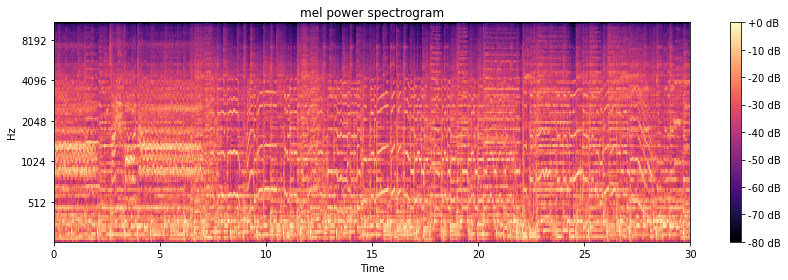

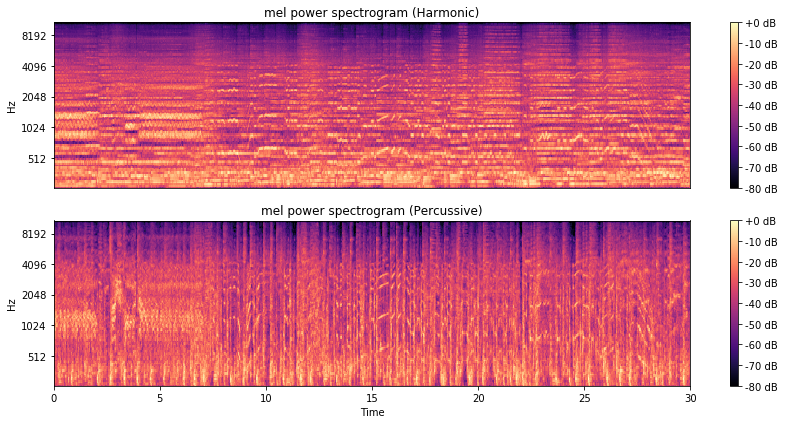

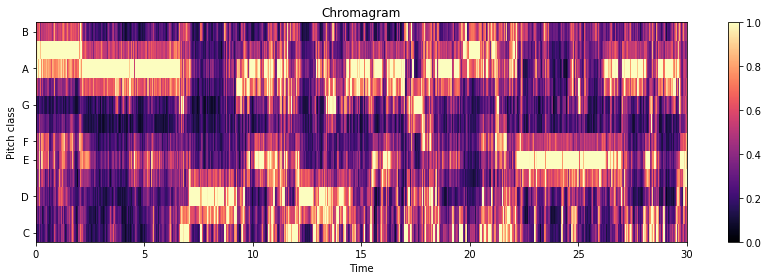

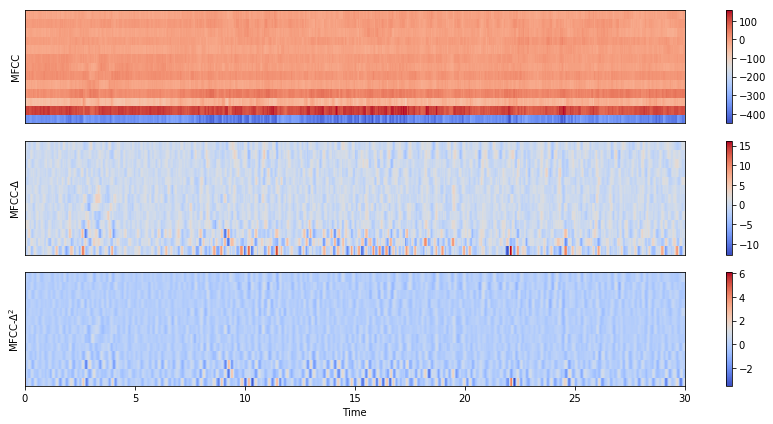

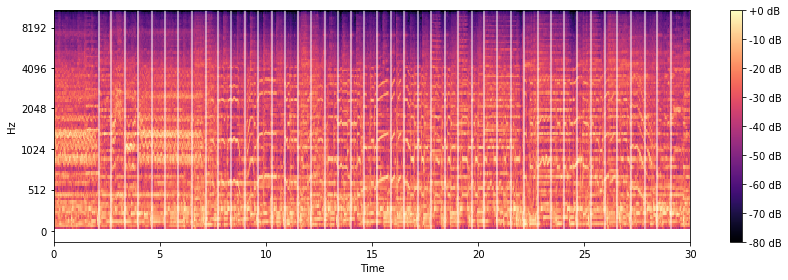

Estimated tempo:        95.70 BPM
First 5 beat frames:    [ 91 117 144 172 199]
First 5 beat times:     [ 2.11301587  2.71673469  3.34367347  3.9938322   4.62077098]


NameError: name 'bands' is not defined

In [15]:
audio_path = 'movie_genres/wav_cropped30s/action.Bill Conti - Gonna Fly Now (Theme From Rocky).wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
#show_beat_synchronous_feature_aggregation(audio_path)
extract_features(audio_path)
predict(audio_path,bands, frames)

## Adventure Sample 

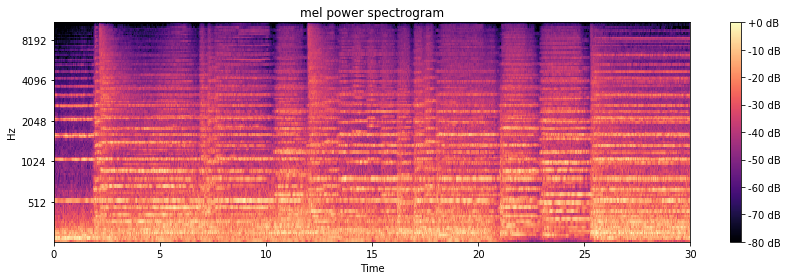

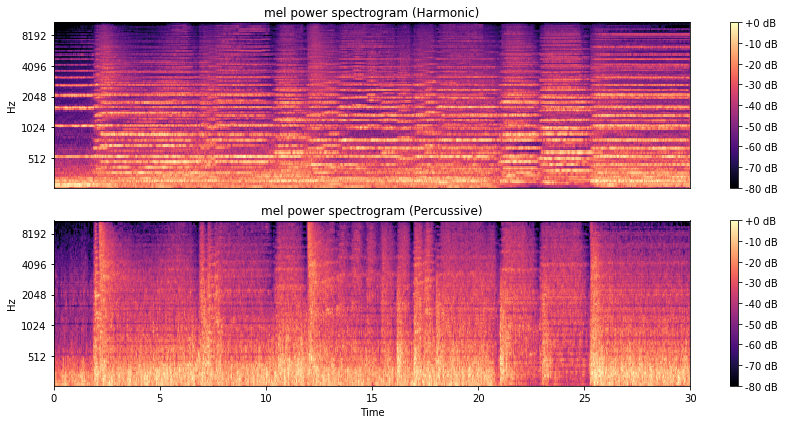

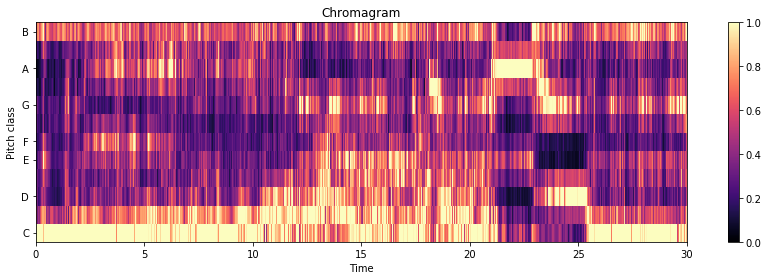

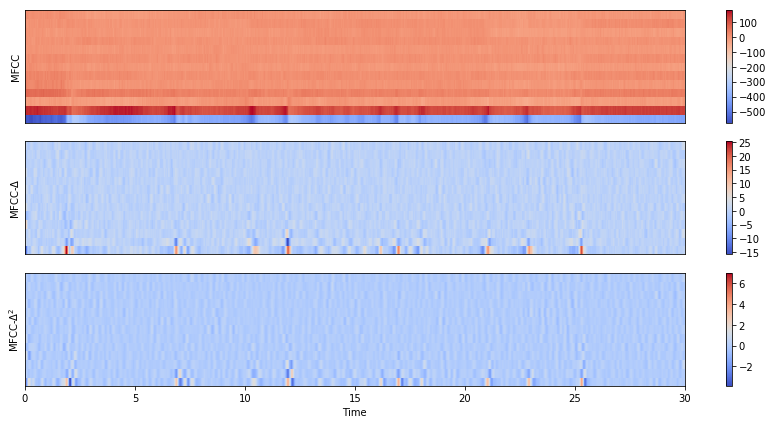

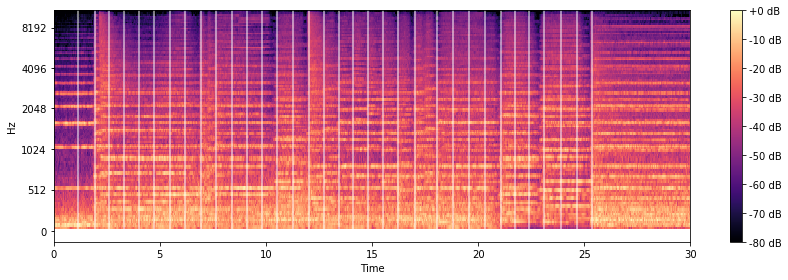

Estimated tempo:        80.75 BPM
First 5 beat frames:    [ 50  83 113 143 174]
First 5 beat times:     [ 1.16099773  1.92725624  2.62385488  3.32045351  4.04027211]
label predict adventure number 2001 A Space Odyssey Opening in 1080 HD
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [ 1  9  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1 10  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  8  1  1  1  1  1  1  9  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  9  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  6]
['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
Counter Elements Counter({1: 82, 9: 3, 8: 1, 10: 1, 6: 1})
Class (Majority Voting): adventure


'adventure'

In [23]:
audio_path = 'movie_genres/wav_cropped30s/adventure.2001 A Space Odyssey Opening in 1080 HD.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path,bands, frames)

## Comedy Sample 

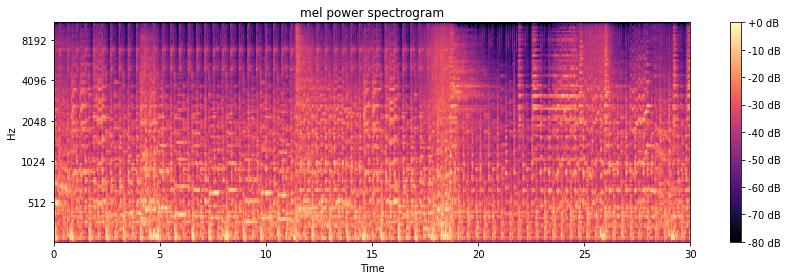

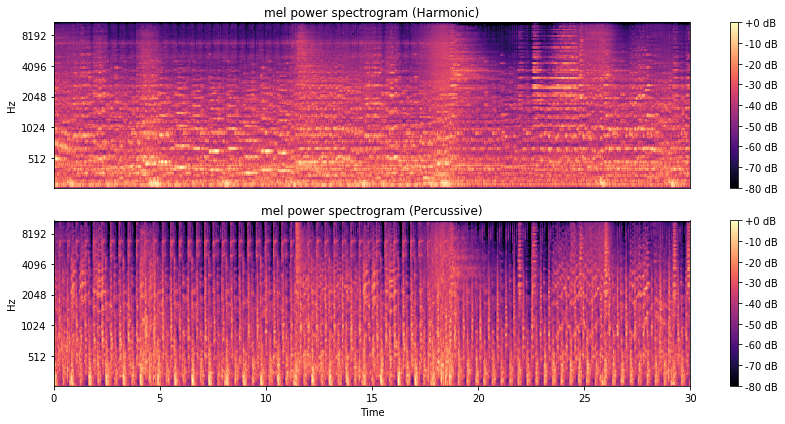

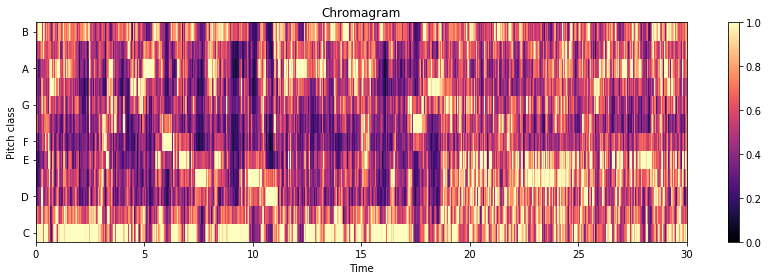

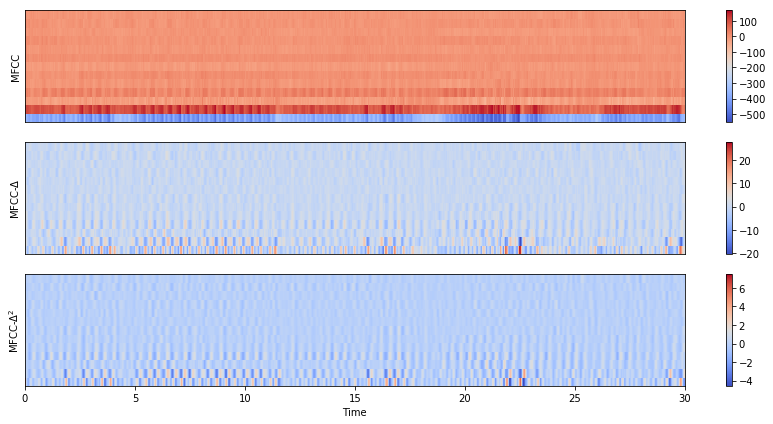

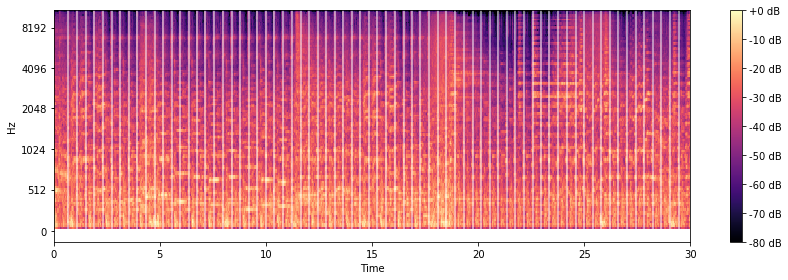

Estimated tempo:        152.00 BPM
First 5 beat frames:    [ 30  48  65  82 100]
First 5 beat times:     [ 0.69659864  1.11455782  1.50929705  1.90403628  2.32199546]
label predict comedy number Beetlejuice Soundtrack Part 1
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [ 2  2  2  2  2  2  2  2  2  2  2  2  1  1  2  2  2  4  2  2  2 10  2  8  2
  2  2  2  2  6  2  9  2  2  2  2  0  0  2  2  2  2  2  2  2  2  2  2  2  2
  2  1  1  0  2  0  2  2  2  2  2  2  6  6  2  2  2  2  6  1  1  2  2  2  2
  4  2  2  2  2  2  2  2  2  2  2  2  2]
['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
Counter Elements Counter({2: 69, 1: 6, 0: 4, 6: 4, 4: 2, 8: 1, 9: 1, 10: 1})
Class (Majority Voting): comedy


'comedy'

In [24]:
audio_path = 'movie_genres/wav_cropped30s/comedy.Beetlejuice Soundtrack Part 1.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path,bands, frames)

## Dance Sample 

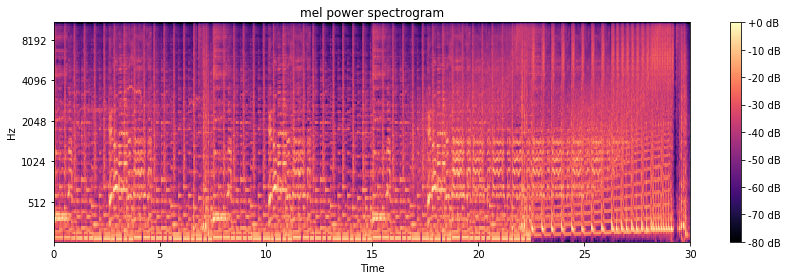

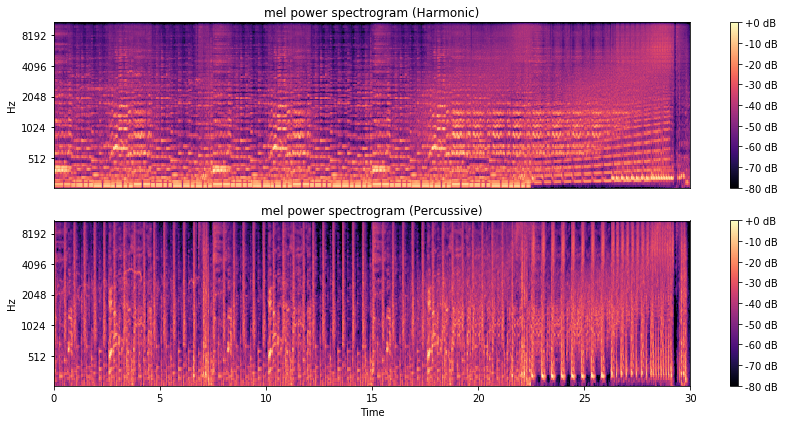

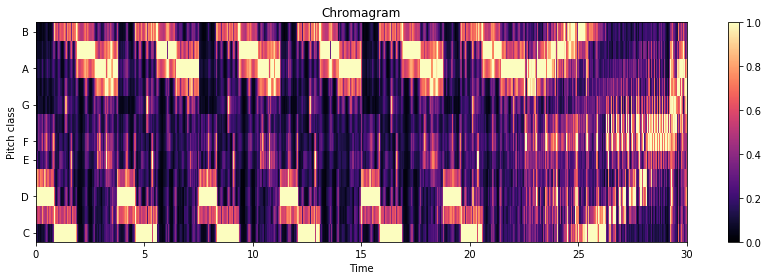

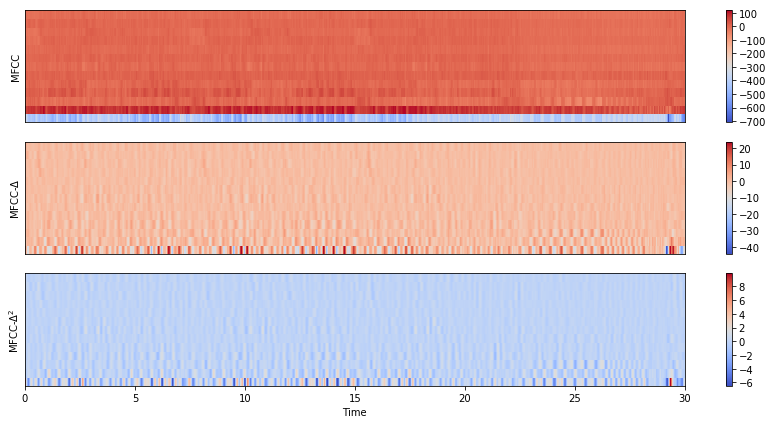

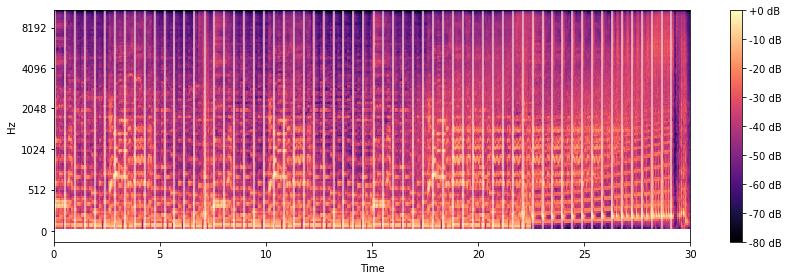

Estimated tempo:        129.20 BPM
First 5 beat frames:    [ 3 23 43 63 84]
First 5 beat times:     [ 0.06965986  0.53405896  0.99845805  1.46285714  1.95047619]
label predict dance number Cuba 2012 (DJ Rebel StreetDance 2 Remix)- Latin Formation (Street Dance 2 OST)
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [3 0 0 5 4 2 3 3 2 3 3 3 3 3 5 0 4 3 3 0 3 3 3 7 3 7 0 3 3 3 2 3 3 3 3 3 3
 0 3 3 3 0 0 0 1 5 3 3 7 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 5 0 3 3 0
 3 3 3 3 3 0 0 0 0 0 0 3 3 3]
['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
Counter Elements Counter({3: 58, 0: 17, 5: 4, 2: 3, 7: 3, 4: 2, 1: 1})
Class (Majority Voting): dance


'dance'

In [25]:
audio_path = 'movie_genres/wav_cropped30s/dance.Cuba 2012 (DJ Rebel StreetDance 2 Remix)- Latin Formation (Street Dance 2 OST).wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path,bands, frames)

## Drama Sample 

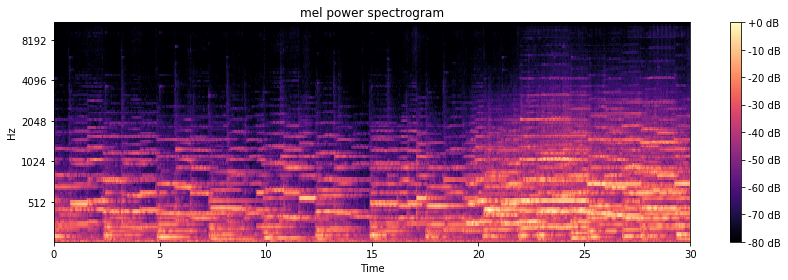

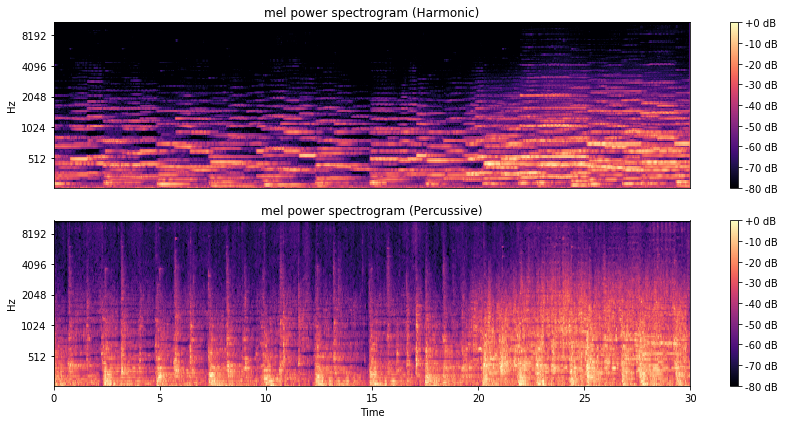

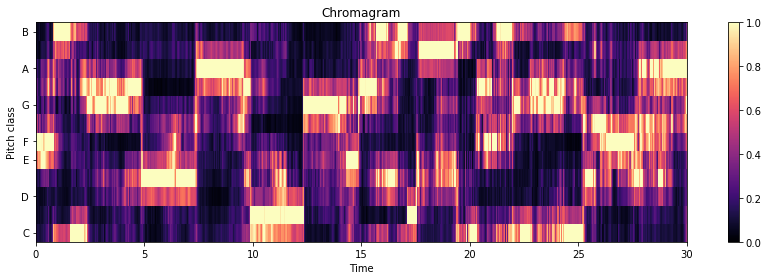

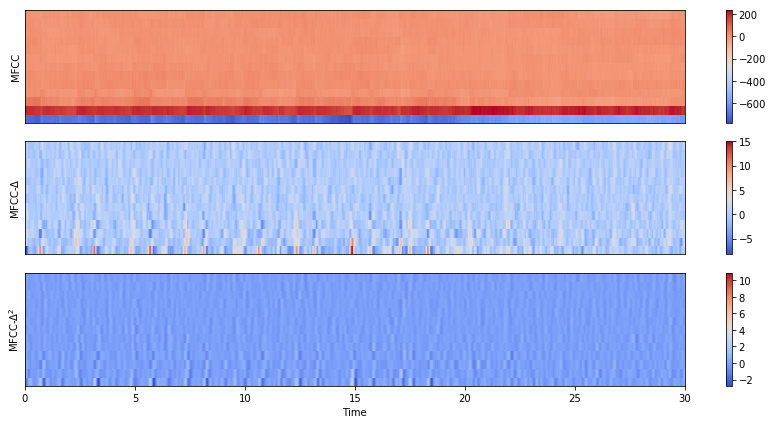

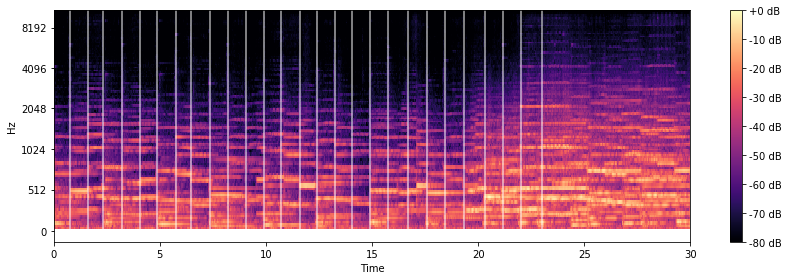

Estimated tempo:        69.84 BPM
First 5 beat frames:    [ 34  69 101 139 176]
First 5 beat times:     [ 0.78947846  1.60217687  2.34521542  3.2275737   4.08671202]
label predict drama number 09 Magnolia
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [8 8 8 4 4 4 4 4 4 7 4 4 4 4 4 4 4 8 8 4 6 4 4 4 1 4 4 4 4 4 4 8 8 4 4 4 4
 4 4 4 4 4 6 8 4 4 4 4 4 4 4 4 4 4 4 8 4 8 7 8 8 4 7 8 8 4 4 7 4 4 7 9 9 4
 8 8 4 4 4 6 8 8 4 4 4 4 4 4]
['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
Counter Elements Counter({4: 59, 8: 18, 7: 5, 6: 3, 9: 2, 1: 1})
Class (Majority Voting): drama


'drama'

In [26]:
audio_path = 'movie_genres/wav_cropped30s/drama.09 Magnolia.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path,bands, frames)

## Gangster Sample

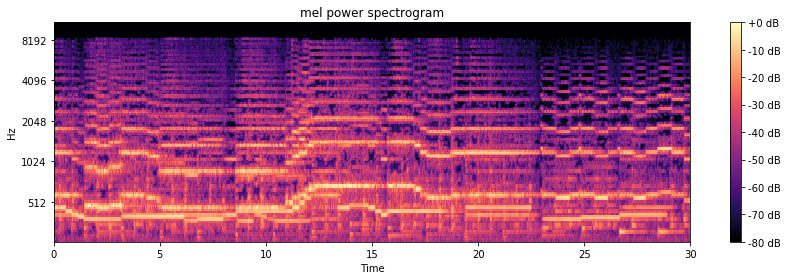

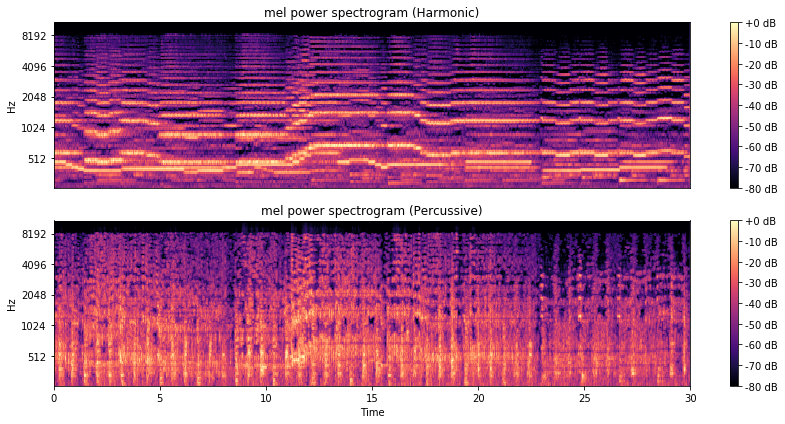

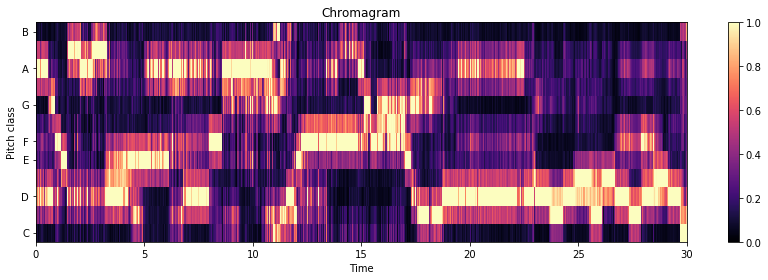

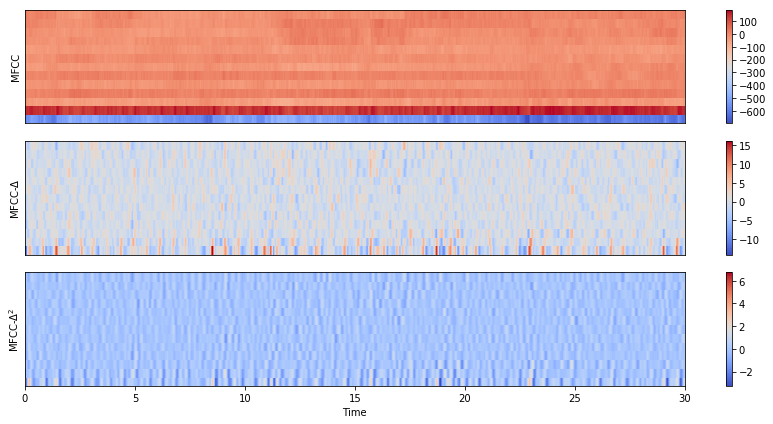

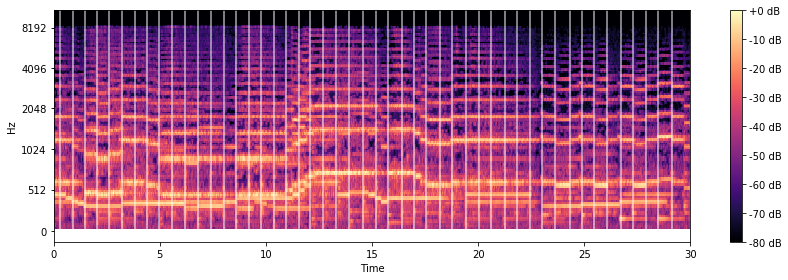

Estimated tempo:        99.38 BPM
First 5 beat frames:    [ 13  39  64  88 113]
First 5 beat times:     [ 0.30185941  0.90557823  1.4860771   2.04335601  2.62385488]
label predict gangster number The God Father Theme Song
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [ 5  5  5  1  1  5  5  5  5  5  5  5  5  5  5  9  5  1  9  5  5  5  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  9  9  5  5  5
  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  5  4  5  5
  5  5  5  5  5  5  5 10  5  5  5  5  5]
['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
Counter Elements Counter({5: 79, 9: 4, 1: 3, 10: 1, 4: 1})
Class (Majority Voting): gangster


'gangster'

In [27]:
audio_path = 'movie_genres/wav_cropped30s/gangster.The God Father Theme Song.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path,bands, frames)

## Horror Sample

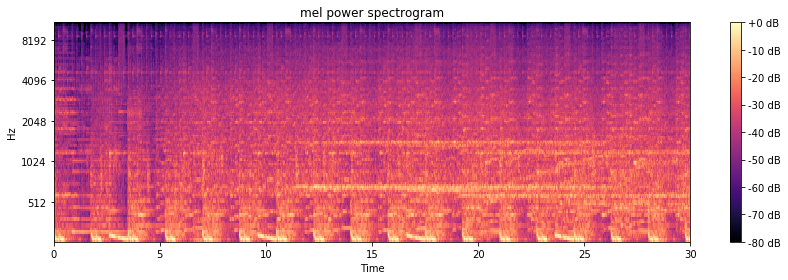

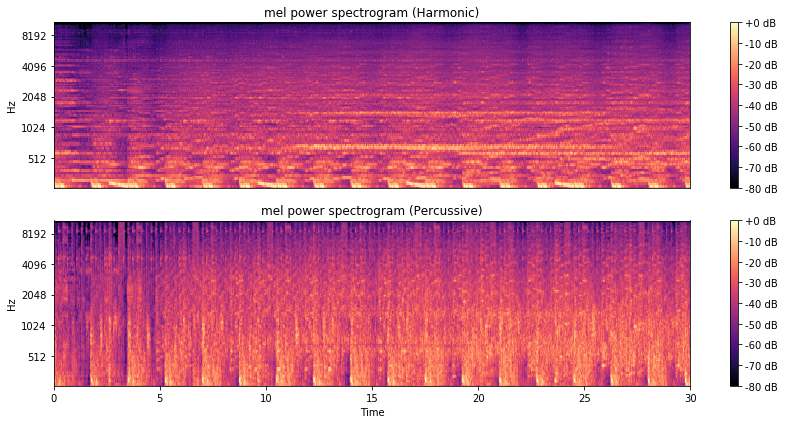

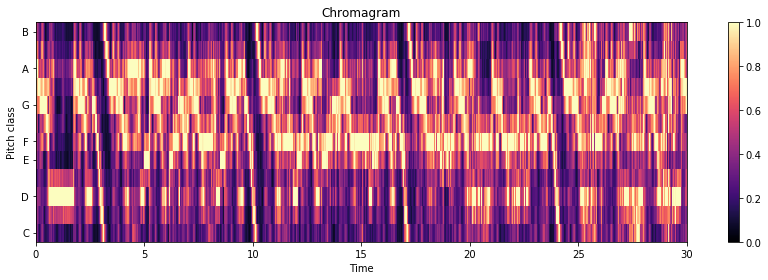

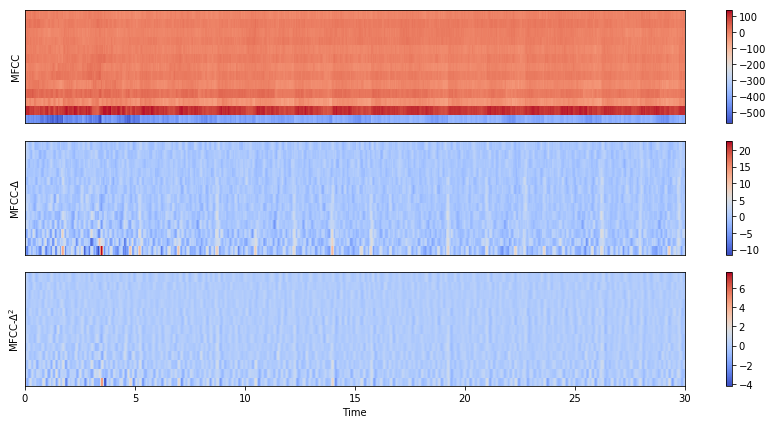

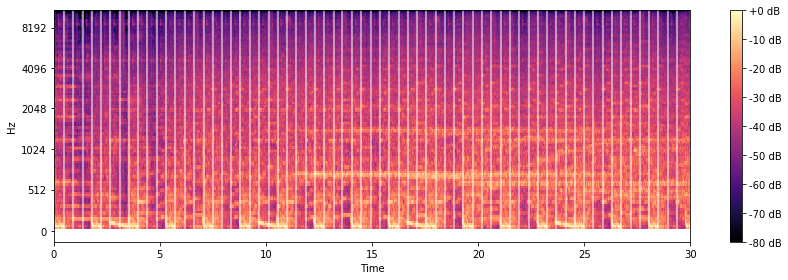

Estimated tempo:        136.00 BPM
First 5 beat frames:    [21 40 59 77 96]
First 5 beat times:     [ 0.48761905  0.92879819  1.36997732  1.78793651  2.22911565]
label predict horror number Saw Theme Song- Hello Zepp
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [ 6  6  6  2  2  8  6  1  6  6  6  6  6  6  1  6  8  1  1  1  6  6  6  6  8
  6  6  6  1  6  3  6  6  6  6  6  6  6  6  6  8  6  6  6  6  1  6  6  6  6
  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  6  1 10  6  6  6  6  6  6]
['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
Counter Elements Counter({6: 72, 1: 8, 8: 4, 2: 2, 3: 1, 10: 1})
Class (Majority Voting): horror


'horror'

In [28]:
audio_path = 'movie_genres/wav_cropped30s/horror.Saw Theme Song- Hello Zepp.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path,bands, frames)

## Romance Sample

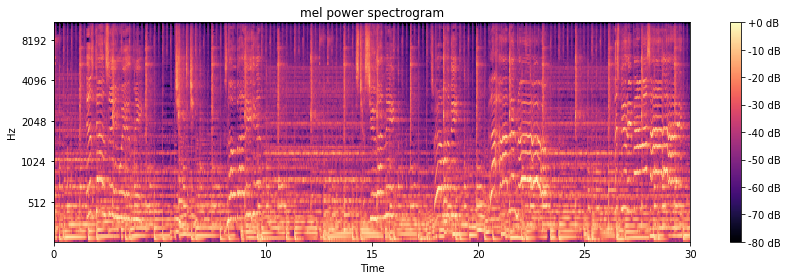

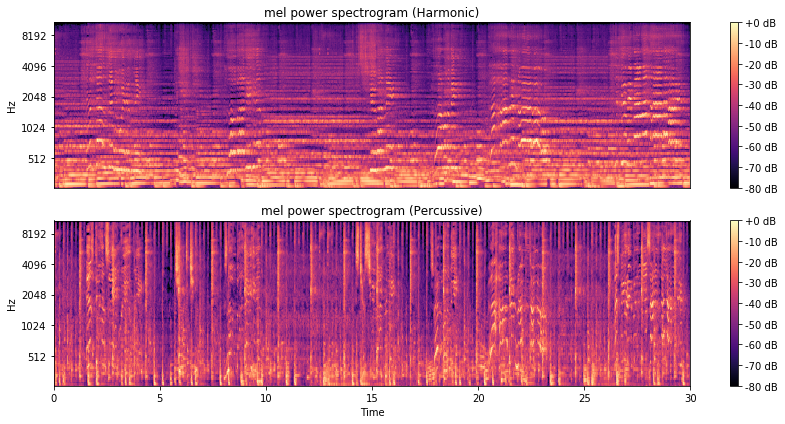

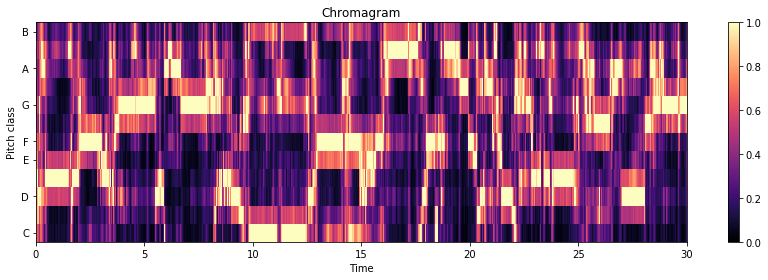

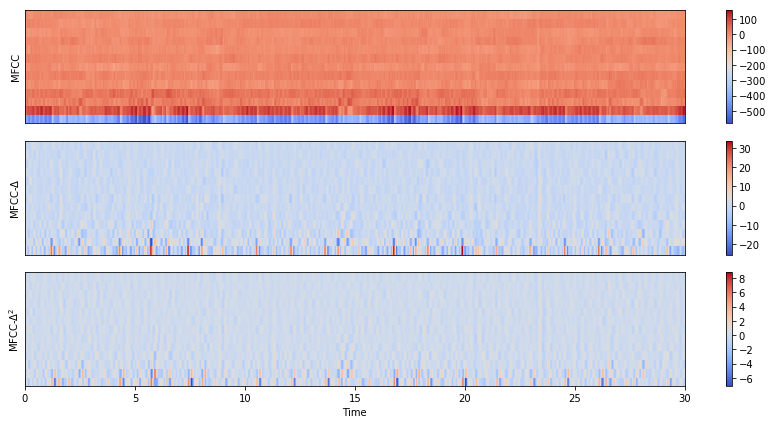

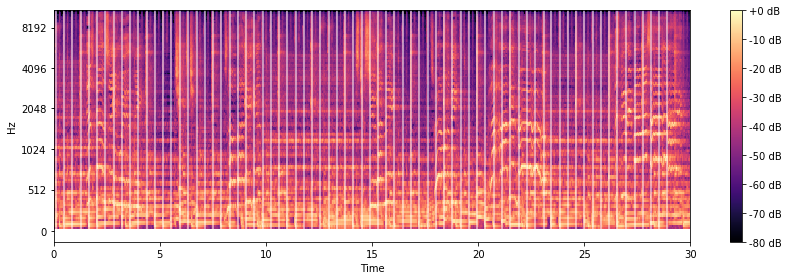

Estimated tempo:        152.00 BPM
First 5 beat frames:    [ 5 21 38 55 71]
First 5 beat times:     [ 0.11609977  0.48761905  0.88235828  1.27709751  1.64861678]
label predict romance number Pretty Woman - chris de burgh
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [ 7  7  7  7  0  7  7  7  7  7  0  9  0  7  7  7  5  7  5  7  7  4  5  7  7
  7  7  7  7  5  7  7  6 10  7  7  7  7  6  7 10  7  7  7  7  7  7  7  7  7
  7  7  7  0  0  4  4 10  7  5  7  7  7  7  7  7  7  5  2  7  3  8  7  8  6
  7  3  0  0  7  7  7  2  7  7  7  7  7]
['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
Counter Elements Counter({7: 59, 0: 7, 5: 6, 4: 3, 6: 3, 10: 3, 2: 2, 3: 2, 8: 2, 9: 1})
Class (Majority Voting): romance


'romance'

In [29]:
audio_path = 'movie_genres/wav_cropped30s/romance.Pretty Woman - chris de burgh.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path,bands, frames)

## Sci-fi Sample

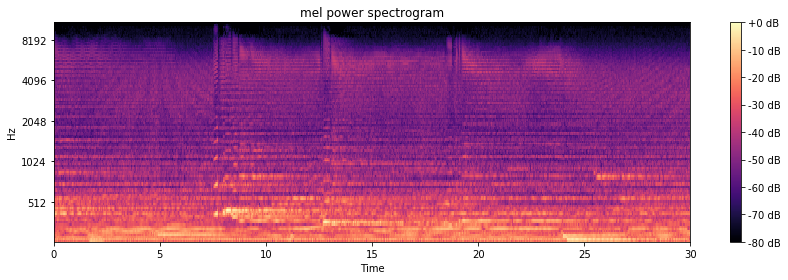

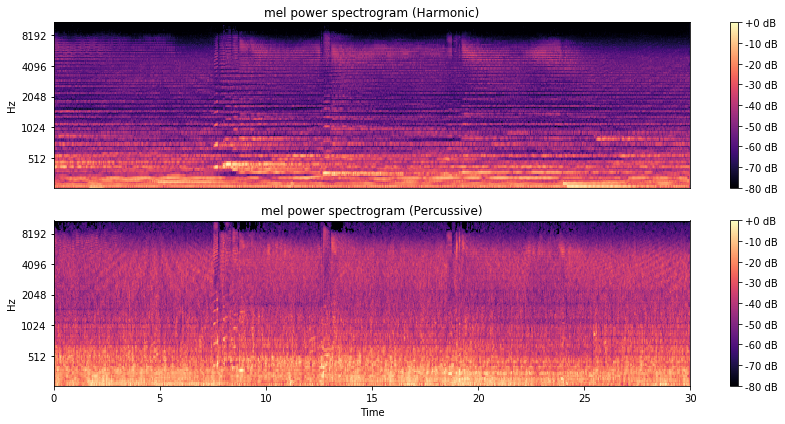

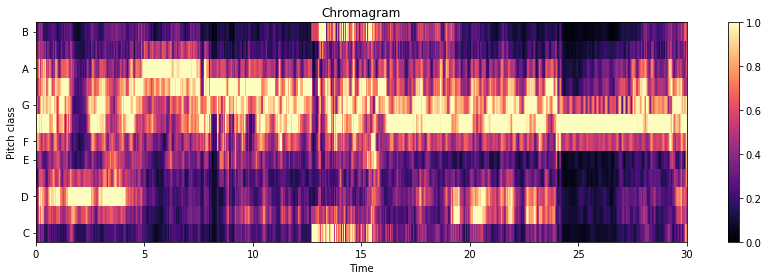

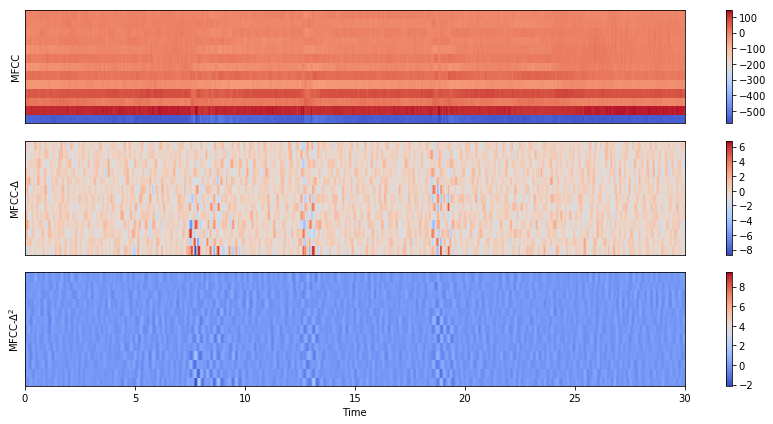

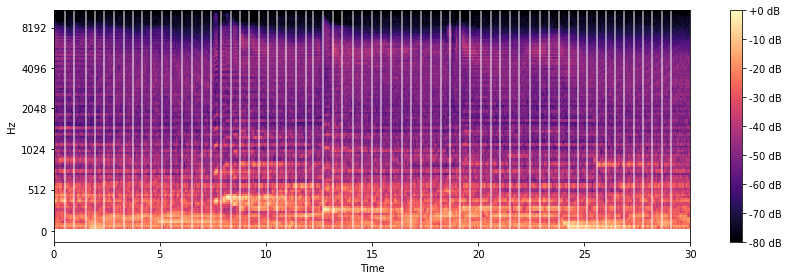

Estimated tempo:        129.20 BPM
First 5 beat frames:    [ 22  42  65  84 103]
First 5 beat times:     [ 0.510839    0.9752381   1.50929705  1.95047619  2.39165533]
label predict scifi number Blade Runner Blues - Vangelis - 1982 - [HD]
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8 8
 8 8 8 8 8 8 8 8 8 8 8 8 8 8]
['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
Counter Elements Counter({8: 88})
Class (Majority Voting): scifi


'scifi'

In [30]:
audio_path = 'movie_genres/wav_cropped30s/scifi.Blade Runner Blues - Vangelis - 1982 - [HD].wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path,bands, frames)

## War Sample

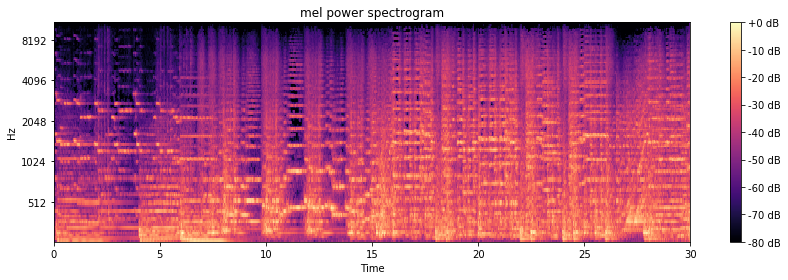

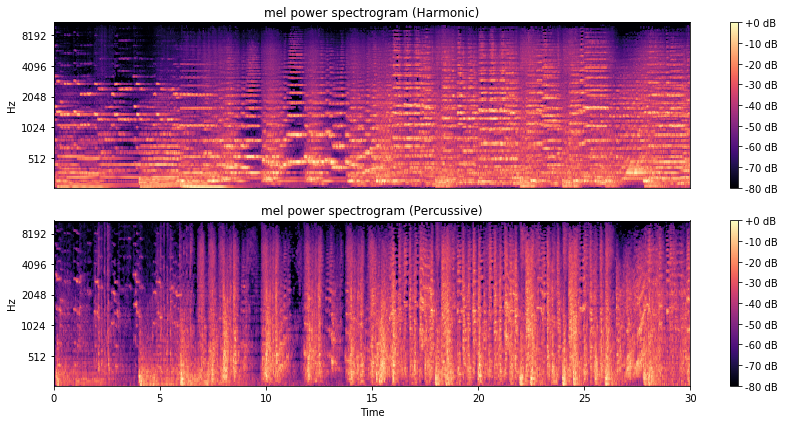

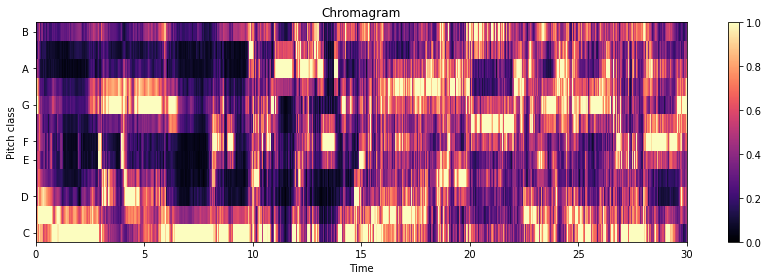

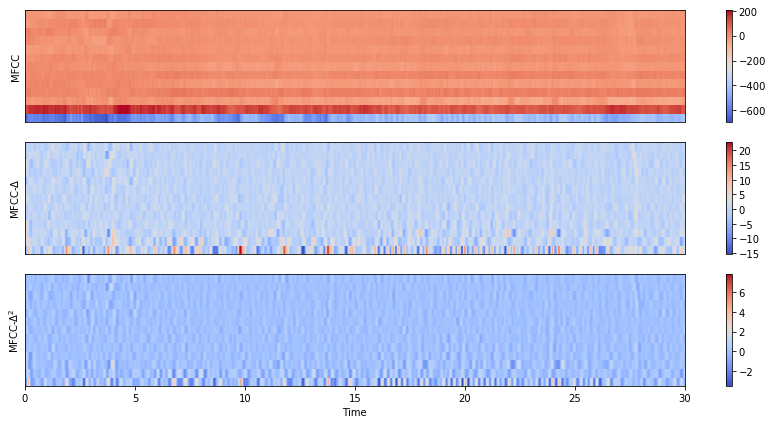

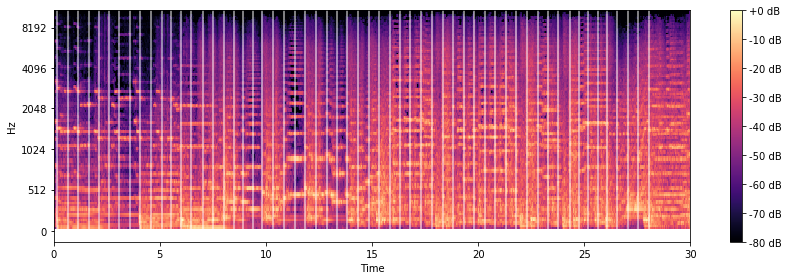

Estimated tempo:        123.05 BPM
First 5 beat frames:    [ 7 29 50 71 92]
First 5 beat times:     [ 0.16253968  0.67337868  1.16099773  1.64861678  2.13623583]
label predict war number PATTON (1970) Main Title - Movie Soundtrack By Jerry Goldsmith
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [ 9  9  6  9  9  9  9  9  9  9  6  9  9  9 10  1  8  8  9  8  9  8  9  8  9
  9  5  9  9  9  9  9  1  9  9  1  9  9  9  9  9  9  9  9  1  1  9  9  9  9
  9  9  9  0  9  9  9  9  9  9  9  9  9  1  9  9  9  9  9  9  9  0  9  9  1
  1  1  1  9 10 10  1  1  9  9  1  1  1]
['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
Counter Elements Counter({9: 60, 1: 15, 8: 5, 10: 3, 0: 2, 6: 2, 5: 1})
Class (Majority Voting): war


'war'

In [31]:
audio_path = 'movie_genres/wav_cropped30s/war.PATTON (1970) Main Title - Movie Soundtrack By Jerry Goldsmith.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path,bands, frames)

## Western Sample

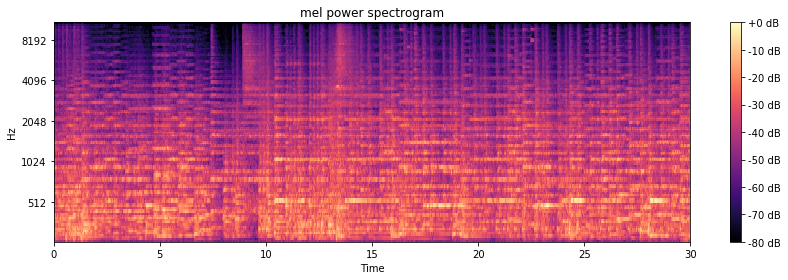

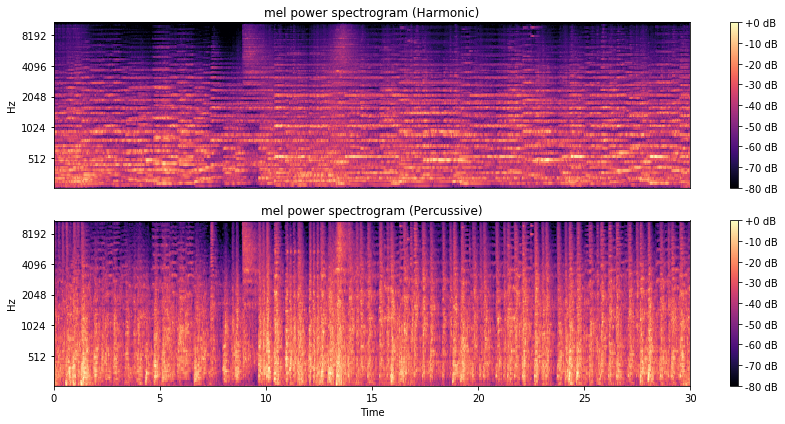

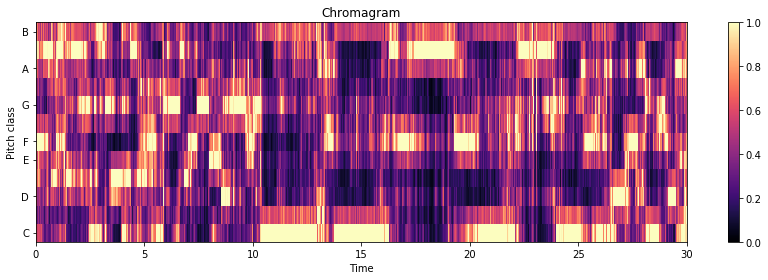

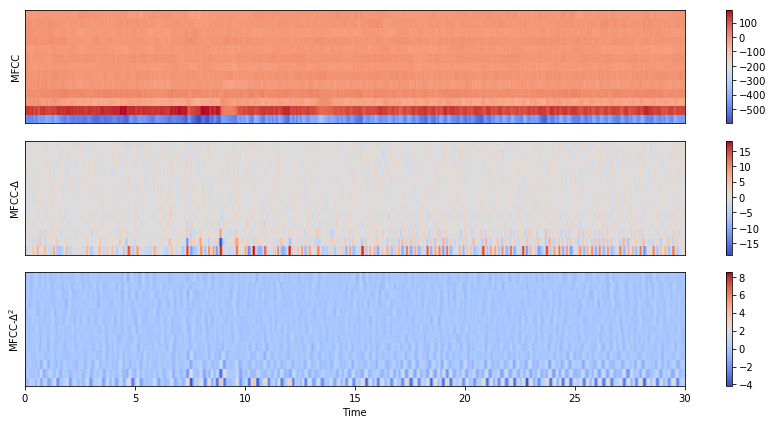

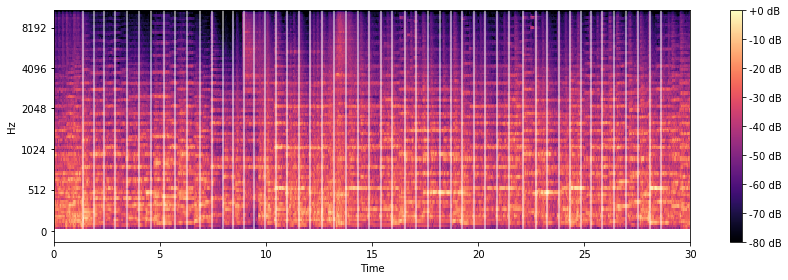

Estimated tempo:        107.67 BPM
First 5 beat frames:    [ 59  81 102 125 148]
First 5 beat times:     [ 1.36997732  1.88081633  2.36843537  2.90249433  3.43655329]
label predict western number Magnificent Seven Theme
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [ 8  8  8  6 10  1  1  1  1  1 10  1 10  1  1  1  1  1  6 10  8  7 10 10 10
  7  0  1  8 10 10 10 10 10 10  1 10 10  1  1 10 10 10 10 10 10  1 10  1 10
 10  1  9  1  1  1 10  1 10  1  1  6  1  1 10 10 10  6  9 10 10 10  1 10  9
 10  1  1  1  1  1 10 10  1  4  1  1  1]
['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
Counter Elements Counter({1: 36, 10: 36, 8: 5, 6: 4, 9: 3, 7: 2, 0: 1, 4: 1})
Class (Majority Voting): adventure


'adventure'

In [32]:
audio_path = 'movie_genres/wav_cropped30s/western.Magnificent Seven Theme.wav'
show_mel_spectogram(audio_path)
show_harmonic_percussive_separation(audio_path)
show_pitch_chromagram(audio_path)
show_mfcc_textures(audio_path)
show_beat_tracking(audio_path)
predict(audio_path,bands, frames)

# Check overall Accuracy (Training)

In [17]:
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score

def check_overall_accuracy(parent_dir,sub_dirs, bands, frames, file_ext="*.wav"):    
    ground_true_movie_genres = []
    predicted_movie_genres = []
    number=0
    for label, sub_dir in enumerate(sub_dirs):
        for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
            label = fn.split('/')[2].split('.')[0] #<path>/<label>.<title>.wav
            title = fn.split('/')[2].split('.')[1] #<path>/<label>.<title>.wav
            number+=1
            print("label check {} title {} number {}".format(label, title, number))
            ground_true_movie_genres.append(str(label))
            predict_genre = predict(fn,bands, frames)
            predicted_movie_genres.append(str(predict_genre))
    print("Classification report: {} \n", (classification_report(ground_true_movie_genres, predicted_movie_genres)))
    print("F1 micro averaging {}:",(f1_score(ground_true_movie_genres, predicted_movie_genres, average='micro')))    

In [34]:
check_overall_accuracy(parent_dir,sub_dirs, bands, frames)

label check action title Angel Of The City - Cobra Soundtrack number 1
label predict action number Angel Of The City - Cobra Soundtrack
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 2 2 2 0 2 2 2 8 2 2 0 2 2 2 2 2 2 4 4
 2 2 0 2 0 2 2 2 2 2 2 2 2 2 0 2 2 2 2 2 2 2 0 2 2 0 0 0 0 2 2 2 2 2 2 0 0
 2 7 0 2 7 7 0 2 2 0 2 2 2 2]
['action', 'adventure', 'comedy', 'dance', 'drama', 'gangster', 'horror', 'romance', 'scifi', 'war', 'western']
Counter Elements Counter({2: 65, 0: 17, 7: 3, 4: 2, 8: 1})
Class (Majority Voting): comedy
label check action title Best of the Best 2 To Be The Best Of The Best Mark Free OST number 2
label predict action number Best of the Best 2 To Be The Best Of The Best Mark Free OST
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     

/home/paulofaria/anaconda2/lib/python2.7/site-packages/sklearn/metrics/classification.py:1115: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


# Check overall Accuracy (Test Independent Dataset)

In [20]:
parent_dir = "movie_genres"
sub_dirs = ["wav_cropped30s_test"]
#frames = 30 
#bands = 82 #mel scales / mfcc coefficients
check_overall_accuracy(parent_dir,sub_dirs, bands, frames)

label check action title 08 - Man Of Steel Soundtrack - Terraforming - Hans Zimmer number 1
label predict action number 08 - Man Of Steel Soundtrack - Terraforming - Hans Zimmer
features size (88, 82, 30, 3)
labels size (88,)
88/88 [==============================] - 0s     
Prediction Value [ 8  8  8  8  8  8  8  6  1  8  8  8  8  8  8  8  6  6  8  8  8  8  8  1  6
  8 10  1  8  8  9  8  8  8  1  6  8  6  8  8  8  1  7  2  8  2  1  8  8  6
  8  0  9  1  1  1  2  1  1  8  8  8  8  1  7  1  8  1  1  1  1  2  2  8  8
  8  1  1  8  1  1  1  8  1  2  7  2  8]


NameError: global name 'le' is not defined